<a href="https://colab.research.google.com/github/pranonrahman/DIP-2021-Tasks/blob/main/DIP_Lab_6_1700414014.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview
In this lab we have to implement different frequency domain operations on images. The tasks are:
* Ideal Low Pass Filter
* Ideal High Pass Filter
* Butterworth Low Pass Filter
* Butterworth High Pass Filter
* Gaussian Low Pass Filter
* Gaussian High Pass Filter

all this filters were implemnted and discussed on this notebook.

---
### Author
Raian Rahman \\
Student id: 170041014 \\
Dept. of Computer Science and Engineering \\
Gazipur, Bangladesh. 

---

## Loading the libraries and images

In [2]:
!pip3 -q install wget

In [86]:
#for iterating through the files and clearing output from the notebook  
import os
from IPython.display import clear_output

#Requred library for editing the files
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

In [5]:
!wget -r 'http://www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH04_Original_Images.zip'

--2021-08-28 16:18:40--  http://www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH04_Original_Images.zip
Resolving www.imageprocessingplace.com (www.imageprocessingplace.com)... 74.208.236.87
Connecting to www.imageprocessingplace.com (www.imageprocessingplace.com)|74.208.236.87|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4398554 (4.2M) [application/zip]
Saving to: ‘www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH04_Original_Images.zip’

www.imageprocessing 100%[===================>]   4.19M  11.7MB/s    in 0.4s    

2021-08-28 16:18:40 (11.7 MB/s) - ‘www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH04_Original_Images.zip’ saved [4398554/4398554]

FINISHED --2021-08-28 16:18:40--
Total wall clock time: 0.5s
Downloaded: 1 files, 4.2M in 0.4s (11.7 MB/s)


In [6]:
!unzip -q '/content/www.imageprocessingplace.com/downloads_V3/dip3e_downloads/dip3e_book_images/DIP3E_CH04_Original_Images.zip' -d '/content/data'

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\


## Subtask 1: Ideal Low Pass Filter

In [36]:
def ideal_low_pass_filter(image, cut_off_freq = 140):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2)*(i-height/2) + (j-width/2)*(j-width/2))

            if cut_off_freq >= distance:
                filter[i][j] = 1
    
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 240')

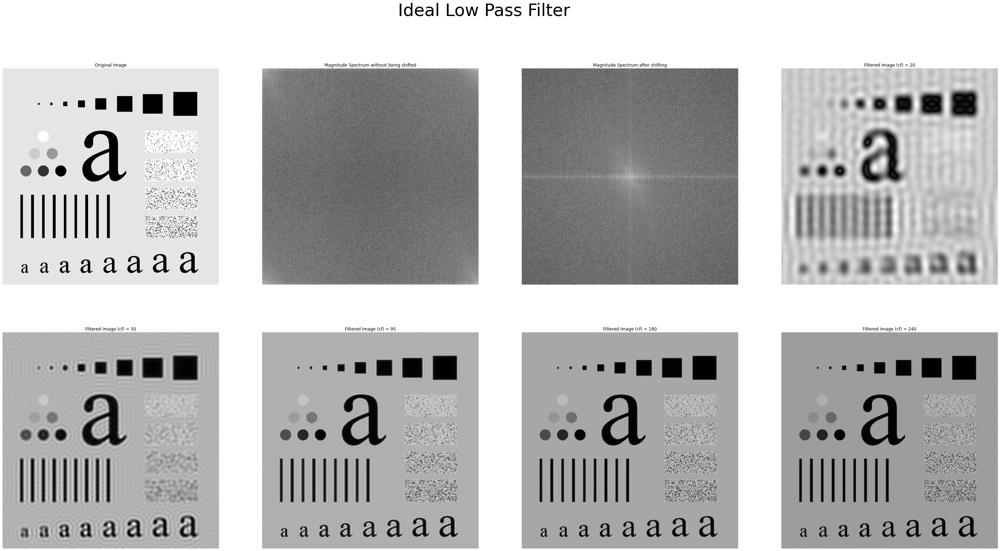

In [103]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))

fig.suptitle('Ideal Low Pass Filter', fontsize=48)

index = 1
fig.add_subplot(2,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = ideal_low_pass_filter(image,20)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20}')



filtered_image = ideal_low_pass_filter(image,50)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50}')


filtered_image = ideal_low_pass_filter(image,95)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95}')


filtered_image = ideal_low_pass_filter(image,180)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180}')

filtered_image = ideal_low_pass_filter(image,240)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240}')

### Discussion
Here, we have ran ideal low pass filter on the original image with different cut off frequency. For a very cut off frequnecy we can see that we have bluring with heavy ripple effect. As we increase the cut off frequency, the effect of bluring and ripple effect, both gets decreased. The reason behind the ripple is the ideal representation of the filter has ripple in it. 

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\


## Subtask 2: Ideal High Pass Filter

In [52]:
 def ideal_high_pass_filter(image, cut_off_freq = 140):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros_like(image)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2)*(i-height/2) + (j-width/2)*(j-width/2))

            if cut_off_freq <= distance:
                filter[i][j] = 1
    
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 240')

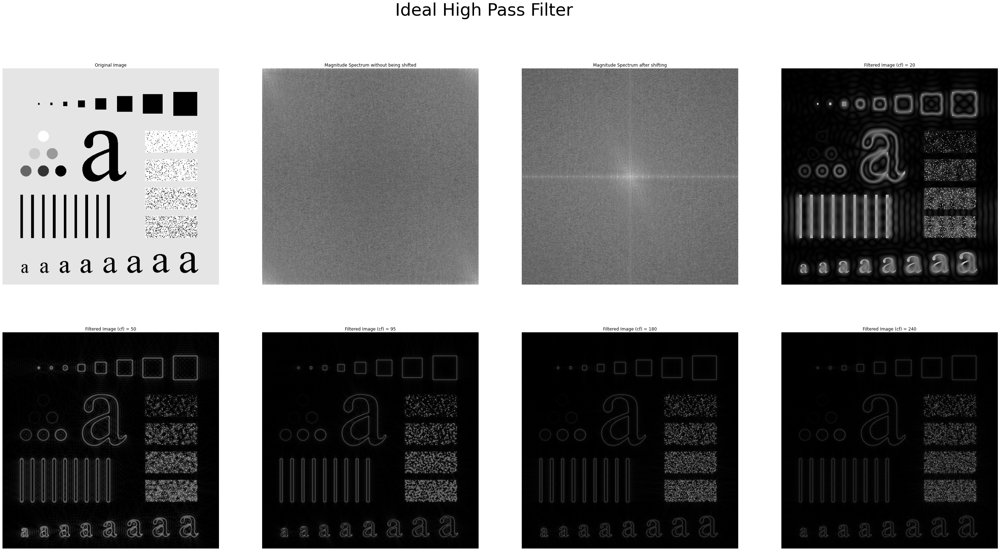

In [104]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))

fig.suptitle('Ideal High Pass Filter', fontsize=48)

index = 1
fig.add_subplot(2,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = ideal_high_pass_filter(image,20)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20}')



filtered_image = ideal_high_pass_filter(image,50)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50}')


filtered_image = ideal_high_pass_filter(image,95)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95}')


filtered_image = ideal_high_pass_filter(image,180)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180}')

filtered_image = ideal_high_pass_filter(image,240)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240}')

### Discussion
Here, we have ran ideal high pass filter on the original image with different cut off frequency. As we can see, we have most of the information retained for edges while the information for smooth area have been lost. As we decrease the cut off frequency, we can see that the edge information is also getting blury while the image has some ripple effect. As the cut off frequency increases the ripple effect decreases and the edge information becomes better. \\
But with higher cut off frequency $(cf = 240)$ the we have started to loose edge information. 

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\


## Subtask 3: Butterworth low pass filter

In [76]:
def butterworth_low_pass_filter(image, cut_off_freq = 140, order=1):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros(image.shape)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2.0)*(i-height/2.0) + (j-width/2.0)*(j-width/2.0))

            filter[i][j] = 1.0/(1.0+((distance/cut_off_freq)**(2.0*order)))
            # print(filter[i][j], distance)
    # cv2_imshow(filter)
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 50 with order of 6')

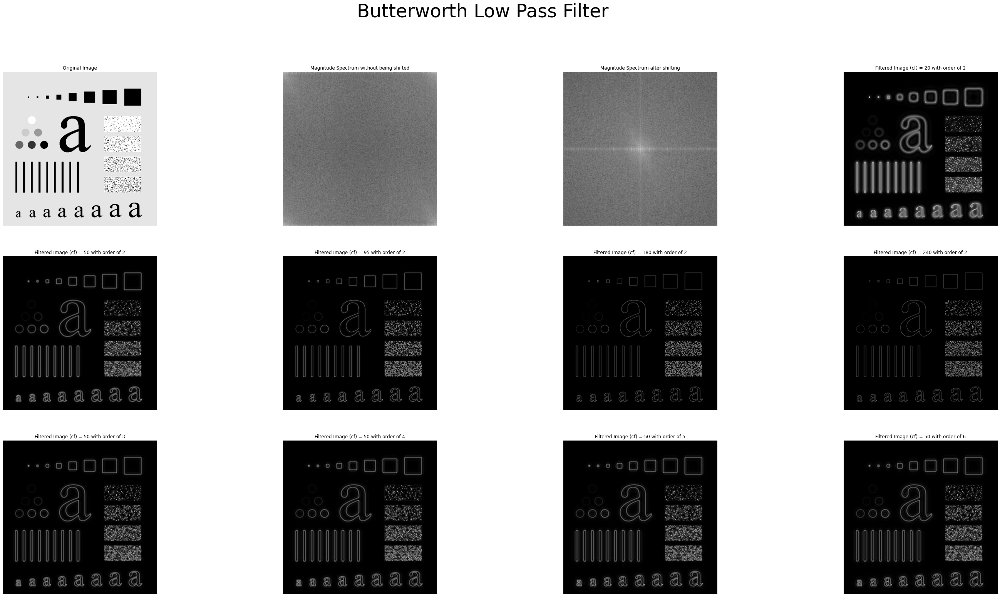

In [105]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))

fig.suptitle('Butterworth Low Pass Filter', fontsize=48)

index = 1
fig.add_subplot(3,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(3,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(3,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = butterworth_low_pass_filter(image,20,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20} with order of {2}')



filtered_image = butterworth_low_pass_filter(image,50,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {2}')


filtered_image = butterworth_low_pass_filter(image,95,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95} with order of {2}')


filtered_image = butterworth_low_pass_filter(image,180,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180} with order of {2}')

filtered_image = butterworth_low_pass_filter(image,240,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240} with order of {2}')


filtered_image = butterworth_low_pass_filter(image,50,3)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {3}')


filtered_image = butterworth_low_pass_filter(image,50,4)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {4}')


filtered_image = butterworth_low_pass_filter(image,50,5)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {5}')

filtered_image = butterworth_low_pass_filter(image,50,6)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {6}')

### Discussion
Here, we have ran butterworth low pass filter on the original image with different cut off frequency. For a low cut off frequency we can see that we have a more smoothing effect **without any ringing effect**. As we increase the cut off frequency, the image gest sharper and sharper. \\

For higher order value, the ringing effect starts to appear. For example, for higher order value, we have more ringing effect. So the filter starts to behave like ideal low pass filter. 

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\

## Subtask 4: Butterworth high pass filter

In [108]:
def butterworth_high_pass_filter(image, cut_off_freq = 140, order=1):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros(image.shape)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2.0)*(i-height/2.0) + (j-width/2.0)*(j-width/2.0))

            filter[i][j] = 1.0/(1.0+((cut_off_freq/distance)**(2.0*order)))
            # print(filter[i][j], distance)
    # cv2_imshow(filter)
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 50 with order of 6')

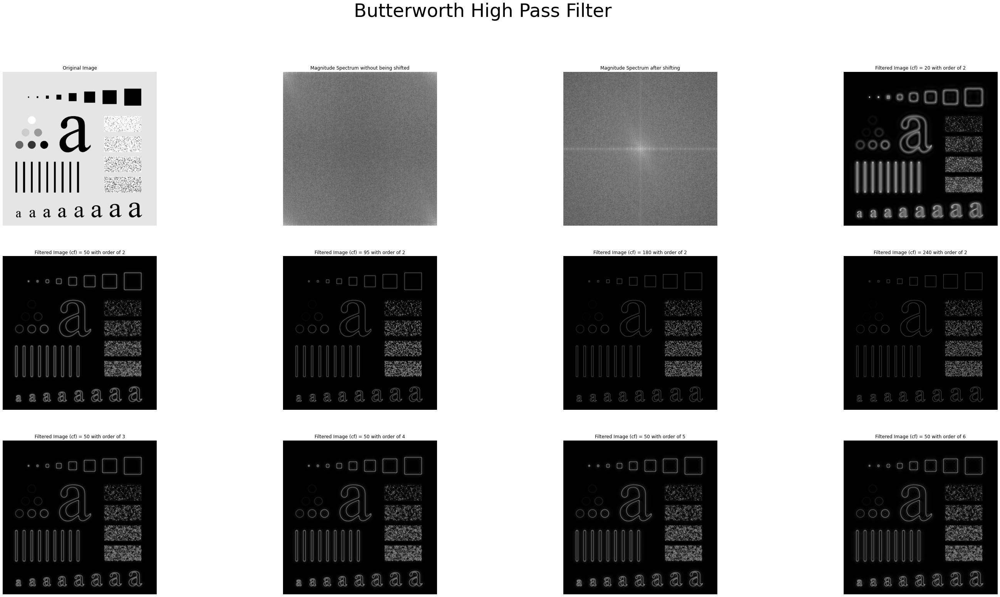

In [109]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))

fig.suptitle('Butterworth High Pass Filter', fontsize=48)

index = 1
fig.add_subplot(3,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(3,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(3,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = butterworth_high_pass_filter(image,20,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20} with order of {2}')



filtered_image = butterworth_low_pass_filter(image,50,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {2}')


filtered_image = butterworth_high_pass_filter(image,95,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95} with order of {2}')


filtered_image = butterworth_high_pass_filter(image,180,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180} with order of {2}')

filtered_image = butterworth_high_pass_filter(image,240,2)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240} with order of {2}')


filtered_image = butterworth_high_pass_filter(image,50,3)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {3}')


filtered_image = butterworth_high_pass_filter(image,50,4)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {4}')


filtered_image = butterworth_high_pass_filter(image,50,5)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {5}')

filtered_image = butterworth_high_pass_filter(image,50,6)
index += 1
fig.add_subplot(3,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50} with order of {6}')

### Discussion
Here, we implemented butterworth high pass filter with different cutt off frequencies and different order values. As we can see, for low cut off frequency the image gets more smoothing effect. At cut off frequency of $95-180$ most of the edge information is retained. But with higher cut off frequency, the image starts to loose its edge information. \\
Also for cut off frequency of $50$, we have shown the effect of different order value. As the order value increases, the ringing effect starts to appear in the image. 

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\

## Subtask 5: Gaussian Low pass filter

In [110]:
def gaussian_low_pass_filter(image, cut_off_freq = 140):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros(image.shape)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2.0)*(i-height/2.0) + (j-width/2.0)*(j-width/2.0))

            filter[i][j]= np.exp(-(distance*distance)/(2.0*cut_off_freq*cut_off_freq))
            # print(filter[i][j], distance)
    # cv2_imshow(filter)
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 240')

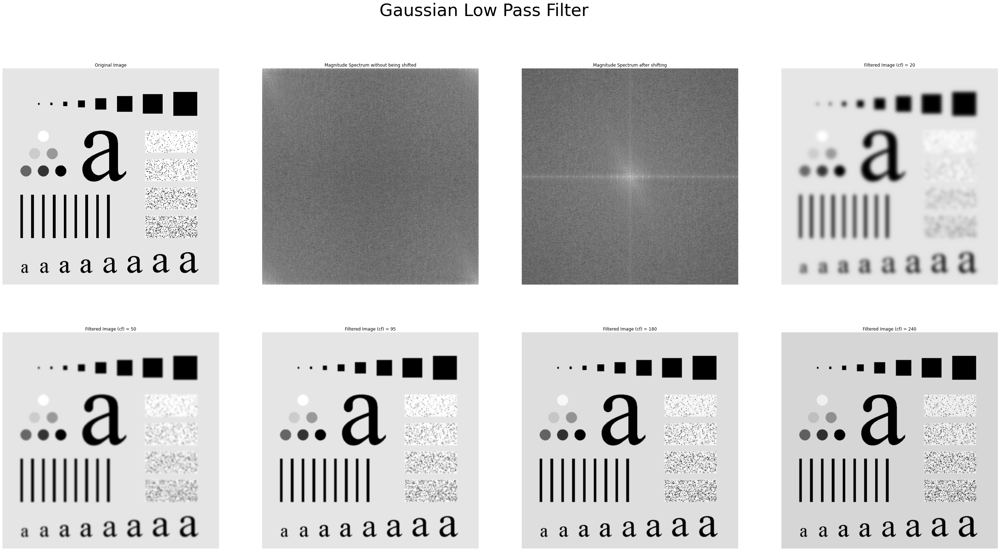

In [111]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))
fig.suptitle('Gaussian Low Pass Filter', fontsize=48)


index = 1
fig.add_subplot(2,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = gaussian_low_pass_filter(image,20)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20}')



filtered_image = gaussian_low_pass_filter(image,50)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50}')


filtered_image = gaussian_low_pass_filter(image,95)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95}')


filtered_image = gaussian_low_pass_filter(image,180)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180}')

filtered_image = gaussian_low_pass_filter(image,240)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240}')

### Discussion
In this section the effect of gaussian low pass filter with different cut off frequency is shown. Here we can see that for low cut off frequencies, we have more smoothing effect on the image. For higher cut off frequencies, the image starts to be sharper. But, it is to be notieced that the images don't have any ringing effect. It is because the filter representation of gaussian filter don't have any ringing effect in in. 

. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\
. \\

## Subtask 6: Gaussian High pass filter

In [97]:
def gaussian_high_pass_filter(image, cut_off_freq = 140):
    frequency_domain = np.fft.fft2(image)
    shifted_frequency_domain = np.fft.fftshift(frequency_domain)
    height, width = shifted_frequency_domain.shape 

    #defining the blank spaces for the image
    filter = np.zeros(image.shape)

    for i in range(height):
        for j in range(width):
            distance = np.sqrt((i-height/2.0)*(i-height/2.0) + (j-width/2.0)*(j-width/2.0))

            filter[i][j]= 1 - np.exp(-(distance*distance)/(2.0*cut_off_freq*cut_off_freq))
            # print(filter[i][j], distance)
    # cv2_imshow(filter)
    filtered_frequency_domain = shifted_frequency_domain*filter
    filtered_image = np.abs(np.fft.ifft2(np.fft.ifftshift(filtered_frequency_domain)))
    return filtered_image

Text(0.5, 1.0, 'Filtered Image (cf) = 240')

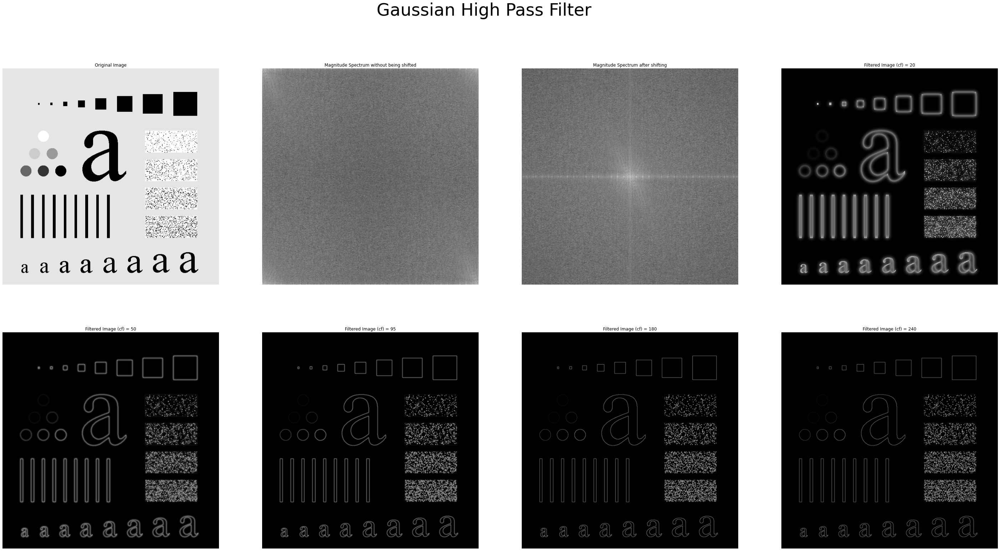

In [107]:
image = cv2.imread('/content/data/DIP3E_Original_Images_CH04/Fig0441(a)(characters_test_pattern).tif',0)

fig = plt.figure(figsize = (50,25))
fig.suptitle('Gaussian High Pass Filter', fontsize=48)


index = 1
fig.add_subplot(2,4,index)
plt.imshow(image, cmap ='gray')
plt.axis('off')
plt.title(f'Original Image')

frequency_domain = np.fft.fft2(image)
shifted_frequency_domain = frequency_domain
# shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum without being shifted')

frequency_domain = np.fft.fft2(image)
# shifted_frequency_domain = frequency_domain
shifted_frequency_domain = np.fft.fftshift(frequency_domain)
scaled_frequency_domain = 20*np.log(np.abs(shifted_frequency_domain))

index += 1
fig.add_subplot(2,4,index)
plt.imshow(scaled_frequency_domain, cmap ='gray')
plt.axis('off')
plt.title(f'Magnitude Spectrum after shifting')


filtered_image = gaussian_high_pass_filter(image,20)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {20}')



filtered_image = gaussian_high_pass_filter(image,50)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {50}')


filtered_image = gaussian_high_pass_filter(image,95)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {95}')


filtered_image = gaussian_high_pass_filter(image,180)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {180}')

filtered_image = gaussian_high_pass_filter(image,240)
index += 1
fig.add_subplot(2,4,index)
plt.imshow(filtered_image, cmap ='gray')
plt.axis('off')
plt.title(f'Filtered Image (cf) = {240}')

### Discussion
In this section the effect of gaussian high pass filter with different cut off frequency is shown. Here we can see that for low cut off frequencies, we have more smoothing effect on the image with only edge information. For higher cut off frequencies $(cf = 95 \& 180)$, the image starts to be sharper with sharp edge information. But as we increase the cut off frequency more and more, the image starts to loose its edge information again. \\
But, it is to be notieced that the images don't have any ringing effect. It is because the filter representation of gaussian filter don't have any ringing effect in in. 